# Physics 260 - Final Project
## Wen Plotnick and Neville Rajappa

## Comparison of Magnetic Bottle and Tokamak Magnetic Trapping Devices

In this project, we will be simulating the trajectory of particles in magnetic fields created by the placement of current conducting wires.

In [1]:
# Import neccesary packages

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.transform import Rotation as R


### Calculation of Magnetic Field At Arbitrary Point due to Current Carrying Coil

To calculate the magnetic field at an arbitrary point due to a current conducting wire, we must use Biot Savart's Law, which states 
$$d\vec{\textbf{\textit{B}}}=\frac{\mu_0Id\vec{L}\times\vec{r}}{4\pi\lVert r\rVert^3}$$

where $d\vec{L}$ is a vector in the direction of current, $\vec{r}$ from the current length to the point, and $I$ being the current.

As we will be numerically integrating over our "ring", we will approximate these values. Our ring is made by taking various points along the circle, so in truth, the modeled rings are closer to many-sided polygons.

In [2]:
def calc_bfield_at_point(grid_point, current_object, print_array_shapes=False) :
    '''This function expects a grid point x, y, z and a current object with attributes matching LineWireCurrent,
    e.g. lwc = LineWireCurrent() or lwc_long = LineWireCurrent(xlims=(-10,10))'''
    delta_r = np.array([grid_point[0] - current_object.xwire,
                        grid_point[1] - current_object.ywire,
                        grid_point[2] - current_object.zwire
                       ])  # This is 3 x number_dl_segments
    # Rename for shorthand
    mu0 = current_object.mu0
    Idl = current_object.I * current_object.dl
    # Key pieces of the Biot-Savart Law
    Idlxdelta_r = np.cross(Idl, delta_r, axisa=0, axisb=0, axisc=0)  # This has shape 3 x number_dl_segments
    cubed_normalization = np.linalg.norm(delta_r, axis=0)**3 # This has shape (number_dl_segments)
    biot_savart_integrand = np.divide(Idlxdelta_r, cubed_normalization)

    #  Note, "integrating", is again, summing all of the contributions from each dl
    return mu0/(4*np.pi) * np.sum(biot_savart_integrand, axis=1)

def find_euclidean_distance(arr, random_argument="blah") :
    print(random_argument)
    return np.sqrt(arr[0]**2+arr[1]**2+arr[2]**2)

In [3]:
# In this code block, we define the class for each current carrying loop
class LoopWireCurrent() :
    '''Define a loop of current. This is discretized by delta_phi.
    Takes optional arguments `xOff`, `yOff`, `zOff`, which specify an offset of the loop from the origin.
    Takes optional argument `theta`, representing the angle in radians to rotate the loop around the x-axis
    '''
    def __init__(self, radius=1.0, dphi=np.pi/10, I=1.0, xOff=0, yOff=0, zOff=0, theta=0, alpha=0, color="black") :
        '''The __init__ function is run when you initialize a LoopWireCurrent object.'''
        # The following simply creates "attributes" of the line of current
        self.phi = np.arange(0,2*np.pi+dphi, dphi)  # All of the dl's are little line segments in the x-direction
        self.dphi = dphi

        # create a rotation object
        r1 = R.from_euler('x', theta)
        # create ring centered around origin
        self.xwire = radius*np.cos(self.phi)
        self.ywire = np.zeros(self.xwire.shape)
        self.zwire = radius*np.sin(self.phi)
        # applying rotation about x axis. As the `r.apply()` function expects it's inputs in a slightly different order, we must transpose the array
        a=np.transpose(r1.apply(np.transpose([self.xwire, self.ywire, self.zwire])))
        self.xwire=a[0]
        self.ywire=a[1]
        self.zwire=a[2]
        
        # applying rotation about z axis.
        r2 = R.from_euler('z', alpha)
        b=np.transpose(r2.apply(np.transpose([self.xwire, self.ywire, self.zwire])))
        self.xwire=b[0]
        self.ywire=b[1]
        self.zwire=b[2]
        
        #adding offset
        self.xwire = self.xwire+xOff
        self.ywire = self.ywire+yOff
        self.zwire = self.zwire+zOff

        # dL vector calculation
        ds = 2*np.pi*radius / self.phi.size
        # we must rotate the dL vectors as well - we use the same rotation method
        self.dl = np.transpose(r1.apply(np.transpose(ds*np.array([np.sin(self.phi),np.zeros(self.phi.size),-np.cos(self.phi)]))))
        self.dl = np.transpose(r2.apply(np.transpose(self.dl)))
        # Pick simple values for the constant mu_0 and the current.
        self.mu0 = 1
        self.I = I
        self.color=color

In [4]:
def graphLoops(loopList, xLim=1.5, yLim=1.5, zLim=1.5):
    '''Takes in a list of loops (or any object with fields `xwire`, `ywire`, `zwire`)
    and plots them on 4 graphs with different viewing angles on each one.
    Takes optional arguments `xLim`, `yLim`, `zLim` to change the limits of the graphs
    '''
    fig = plt.figure(figsize=(40, 10)) # Create figure with proper dimensions
    fig.subplots_adjust(wspace=0,hspace=0) # Make subplots a bit closer together

    # Add first subplot
    ax1 = fig.add_subplot(1, 4, 1, projection='3d') # Subplot creation
    ax1 = fig.gca(projection='3d')
    ax1.view_init(elev=0, azim=0)
    #set limits
    ax1.set_xlim(-xLim, xLim)
    ax1.set_ylim(-yLim, yLim)
    ax1.set_zlim(-zLim, zLim)
    #ensure origin is in graph
    ax1.plot(np.array([0]), (np.array([0])), (np.array([0])))
    #for each loop, plot it's points on the graph with appropriate color
    for i in loopList:
        ax1.plot(i.xwire, i.ywire, i.zwire, c=i.color)

    # repeat for the 4 other views
    ax2 = fig.add_subplot(1, 4, 2, projection='3d')
    ax2 = fig.gca(projection='3d')
    ax2.view_init(elev=0, azim=90)
    ax2.set_xlim(-xLim, xLim)
    ax2.set_ylim(-yLim, yLim)
    ax2.set_zlim(-zLim, zLim)
    ax2.plot(np.array([0]), (np.array([0])), (np.array([0])))
    for i in loopList:
        ax2.plot(i.xwire, i.ywire, i.zwire,c=i.color)

    ax3 = fig.add_subplot(1, 4, 3, projection='3d')
    ax3 = fig.gca(projection='3d')
    ax3.view_init(elev=90, azim=0)
    ax3.set_xlim(-xLim, xLim)
    ax3.set_ylim(-yLim, yLim)
    ax3.set_zlim(-zLim, zLim)
    ax3.plot(np.array([0]), (np.array([0])), (np.array([0])))
    for i in loopList:
        ax3.plot(i.xwire, i.ywire, i.zwire,c=i.color)

    ax4 = fig.add_subplot(1, 4, 4, projection='3d')
    ax4 = fig.gca(projection='3d')
    ax4.view_init(elev=25, azim=45)
    ax4.set_xlim(-xLim, xLim)
    ax4.set_ylim(-yLim, yLim)
    ax4.set_zlim(-zLim, zLim)
    ax4.plot(np.array([0]), (np.array([0])), (np.array([0])))
    for i in loopList:
        ax4.plot(i.xwire, i.ywire, i.zwire,c=i.color)

    fig.subplots_adjust(wspace=0,hspace=0)
    plt.show()


In [5]:
def graphStreamPlots(loopList, xLim=4, yLim=4):
    num_sample_points = 100 #  This determines the resolution of the spatial grid
    # Create arrays for point data
    x_gridpts, y_gridpts, z_gridpts = np.meshgrid(np.array([0]),
                                                  np.linspace(-xLim, xLim, num_sample_points),
                                                  np.linspace(-yLim, yLim, num_sample_points),
                                                  indexing='ij'  # Recall, this was to keep x, y, z ordering.
                                                 )

    # Combine plots
    stacked_gridpts = np.array([x_gridpts, y_gridpts, z_gridpts])
    # Calculate magnetic field contribution due to each loop in loopList and store each in an array
    b_field_loops = [np.apply_along_axis(calc_bfield_at_point, 0, stacked_gridpts, loopy) for loopy in loopList]

    # Summing the magnetic field contribution from each loop
    for j in range(np.alen(b_field_loops)):
        if j==0:
            b_field_loop = b_field_loops[j]
        else:
            b_field_loop += b_field_loops[j]

    # Calculate the magnetic field strength at each point; used for coloring the streamplot
    magnitude_b_field_loop = np.linalg.norm(b_field_loop, axis=0)

    # Get things back into the shape of the desired meshgrid outputs:
    B_y_loop = b_field_loop[1][0]
    B_z_loop = b_field_loop[2][0]

    fig, ax1 = plt.subplots(1, figsize=(8,8))
    color = 2 * np.log(magnitude_b_field_loop[0])    # colors the arrows based on field strength

    ax1.streamplot(z_gridpts[0], y_gridpts[0], B_z_loop, B_y_loop, color=color, linewidth=1, 
                   cmap=plt.cm.inferno, density=1.5, arrowstyle='simple', arrowsize=1.5)

    ax1.set_aspect('equal')
    ax1.set_xlim([-xLim,xLim])
    ax1.set_ylim([-yLim,yLim])
    ax1.set_xlabel('z', fontsize=16)
    ax1.set_ylabel('y', fontsize=16)
    plt.show()


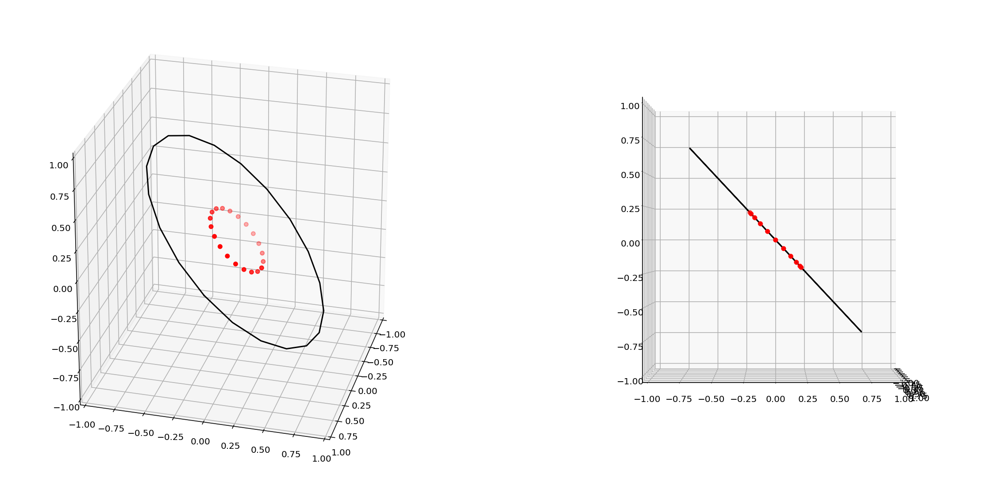

In [6]:
# In this code block, we demonstrate the positioning of a rotated loop, including the dl vectors.
a = LoopWireCurrent(I=2., xOff=0, theta=np.pi/4)
a.dl
fig = plt.figure(figsize=(20, 10))
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1 = fig.gca(projection='3d')
ax1.view_init(elev=25, azim=15)
ax1.set_xlim(-1., 1.)
ax1.set_ylim(-1., 1.)
ax1.set_zlim(-1., 1.)
ax1.scatter(a.dl[0], a.dl[1], a.dl[2], c='red')
ax1.plot(a.xwire,a.ywire,a.zwire, c="black")
ax1.plot(np.array([0]), (np.array([0])), (np.array([0])))
ax2 = fig.add_subplot(1, 2, 2, projection='3d')
ax2 = fig.gca(projection='3d')
ax2.view_init(elev=0, azim=0)
ax2.set_xlim(-1., 1.)
ax2.set_ylim(-1., 1.)
ax2.set_zlim(-1., 1.)
ax2.scatter(a.dl[0], a.dl[1], a.dl[2], c='red')
ax2.plot(a.xwire,a.ywire,a.zwire,c="black")
ax2.plot(np.array([0]), (np.array([0])), (np.array([0])), )
plt.show()

The above graph shows a rotated ring, at an angle of $\pi/4$. The blue lines represent the ring, and the red dots represent the $d\vec{L}$ vectors. A comparison of the rotated loop to a non-rotated loop is seen in the next block, where the red loop is the non-rotated loop, and the blue loop has been rotated by $\pi/2$ degrees.

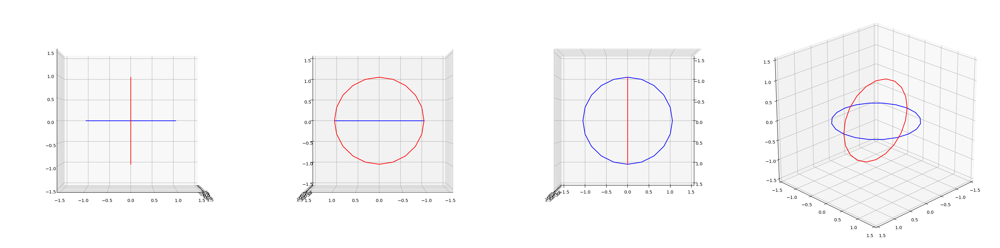

In [7]:
#Comparison of non rotated loop to rotated loop

loop1 = LoopWireCurrent(I=2., xOff=0, theta=np.pi/2, color="blue")
loop2 = LoopWireCurrent(I=2.,color="red")

graphLoops([loop1, loop2])

In the following code block, we graph the magnetic field generated by a coil.

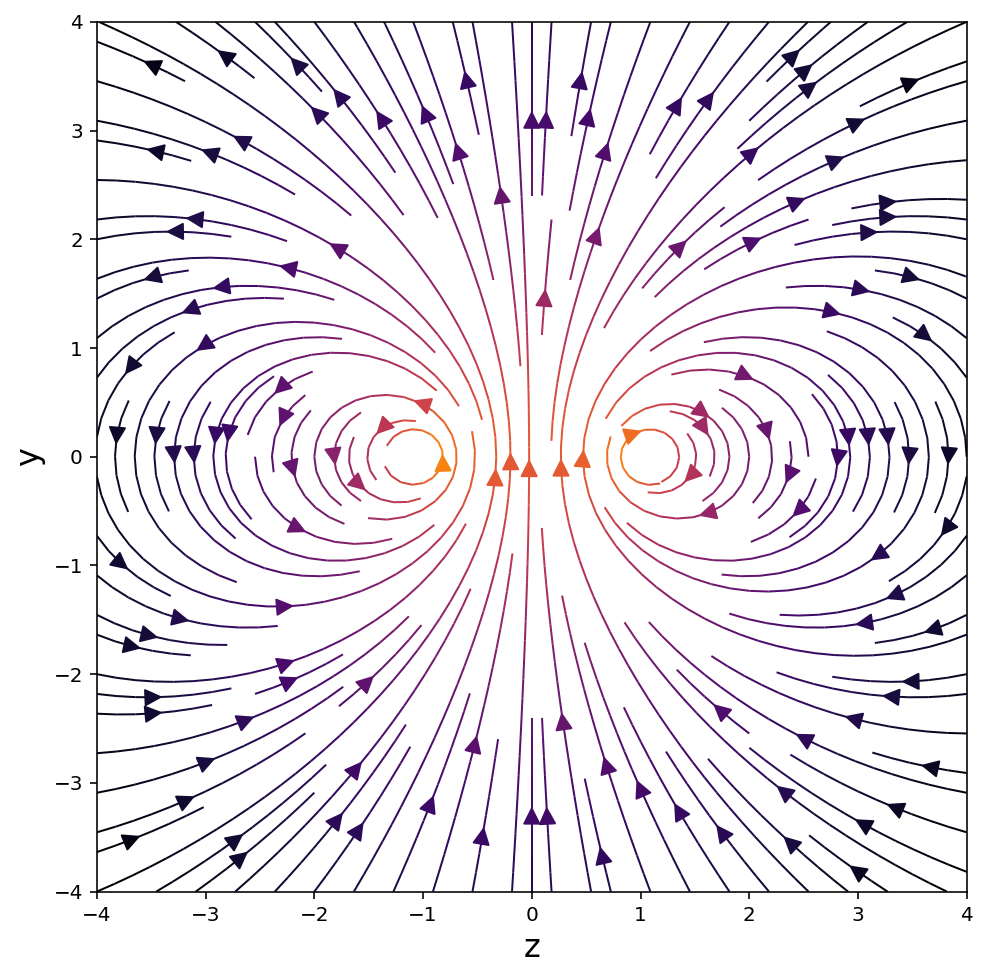

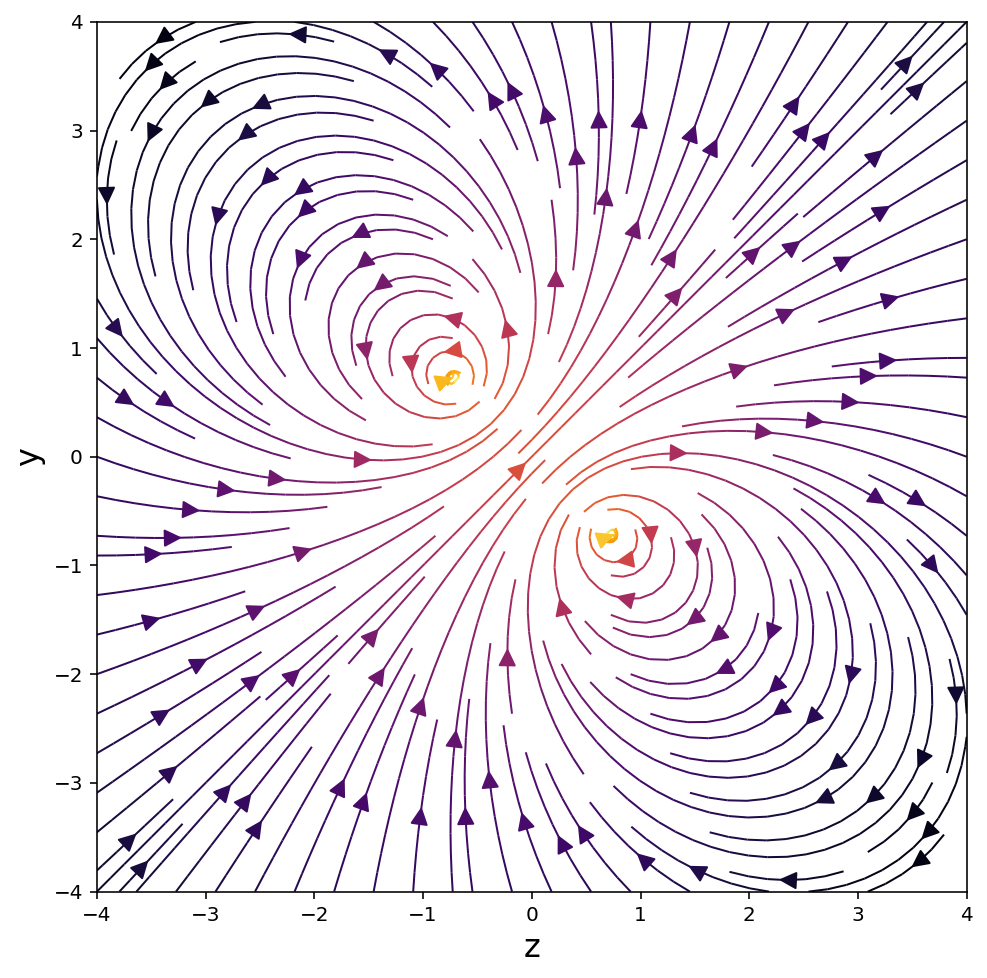

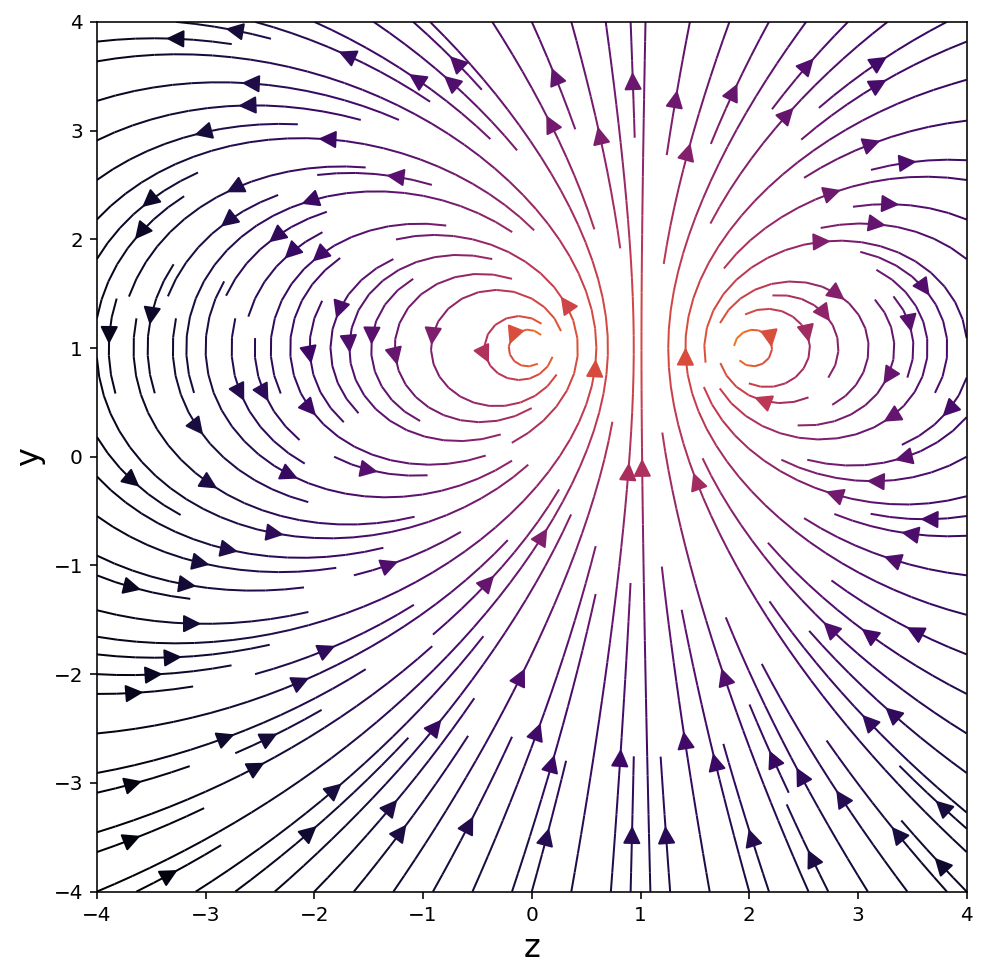

In [8]:
# Normal loop
loop = LoopWireCurrent(I=2.)
graphStreamPlots([loop])

# Rotated loop
loop = LoopWireCurrent(I=2., theta=np.pi/4)
graphStreamPlots([loop])

# Shifted loop
loop = LoopWireCurrent(I=2., yOff=1, zOff=1)
graphStreamPlots([loop])


### Calculation of Magnetic Field at Arbitrary Point due to Many Current Carrying Coils

In this section, we will be creating a prototype for the magnetic bottle. In the magnetic bottle design, there are rings arranged all paralell to each other - however, the rings at the end are much smaller, creating a pinching effect on the field. This pinching effect is what allows for the behavior of the particle to be turned around.

The first diagram drawn is of the setup, where each black ring is carrying a current. The next diagram shows a cross section of the generated magnetic field.

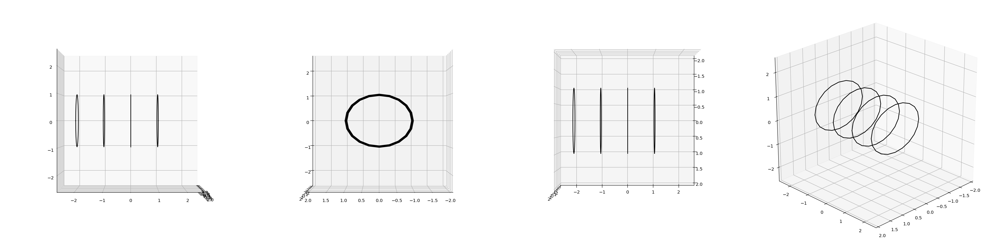

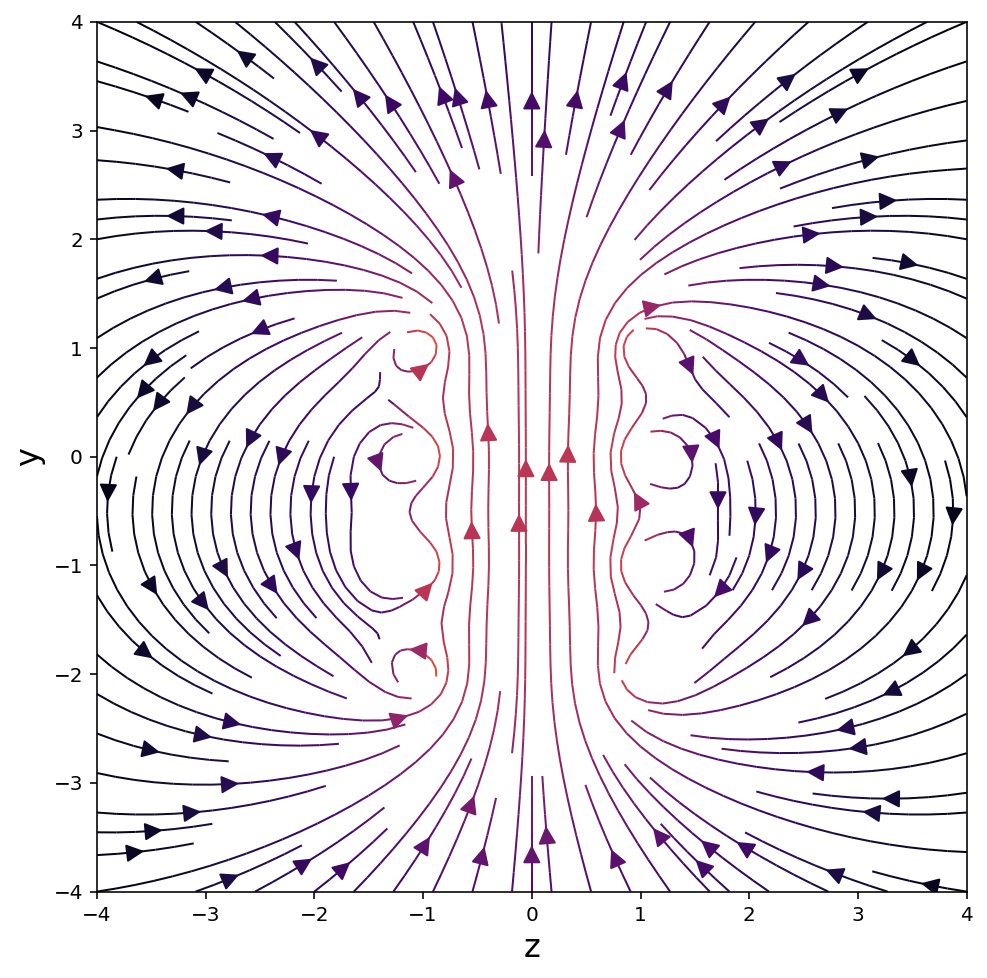

In [9]:
loops = [LoopWireCurrent(yOff=i) for i in np.arange(-2.,2.,1.)]
graphLoops(loops, xLim=2, yLim=2.5, zLim=2.5)
graphStreamPlots(loops)

We see from the cross section of the magnetic field that this is not a great setup for trapping a moving charge particle. We see that if a particle is placed in the center of this field, with some in the positive $y$ direction, the particle will simply continue moving in this $+y$ direction, and eventually leave the coil setup

### Calculation of Magnetic Field due to Magnetic Bottle Setup

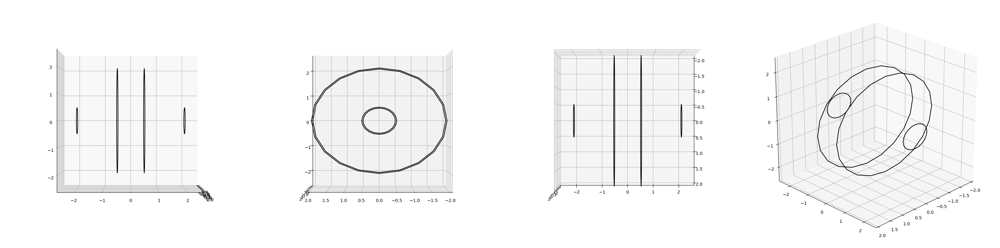

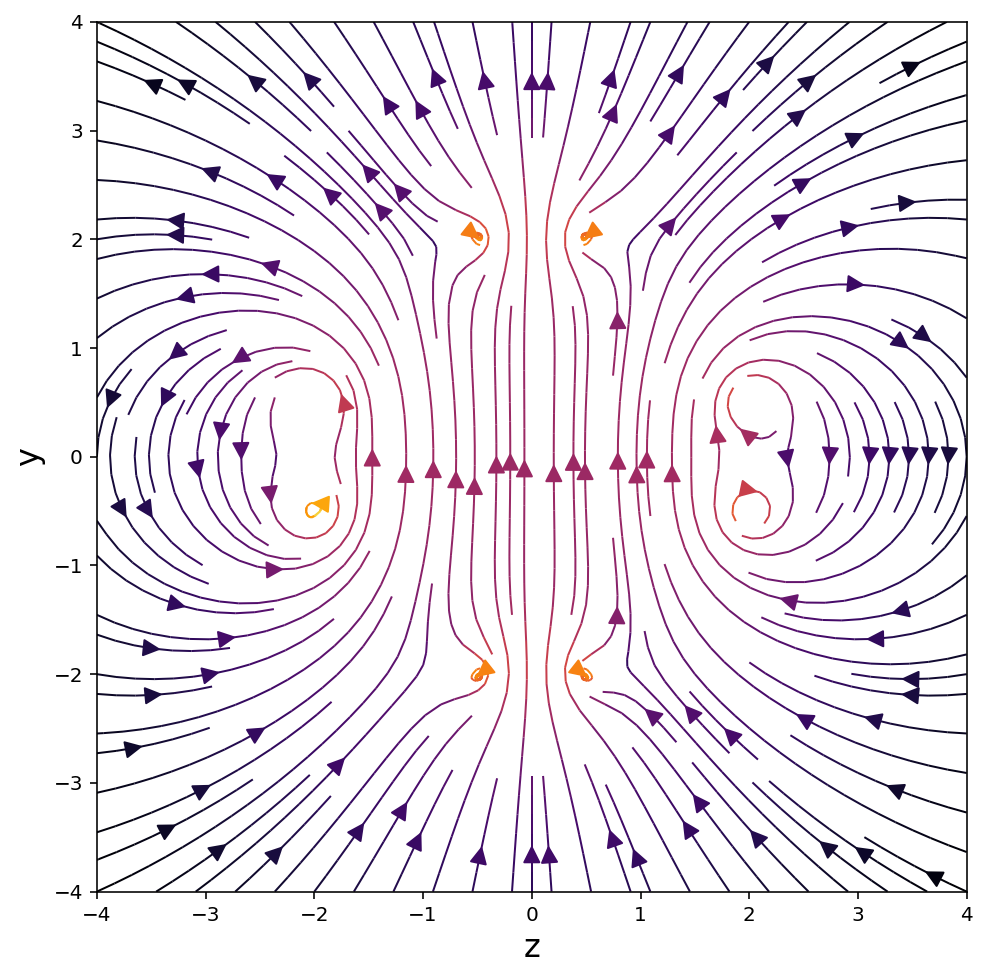

In [10]:
magnetic_bottle_loops = [LoopWireCurrent(radius=r, yOff=y) for [r,y] in [[0.5,-2.], [2.,-0.5], [2.,0.5], [0.5,2.]]]
graphLoops(magnetic_bottle_loops, xLim=2, yLim=2.5, zLim=2.5)
graphStreamPlots(magnetic_bottle_loops)

### Calculation of Magnetic Field due to Tokamak Setup

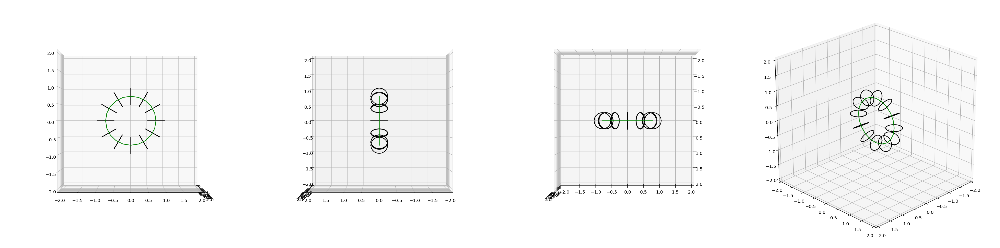

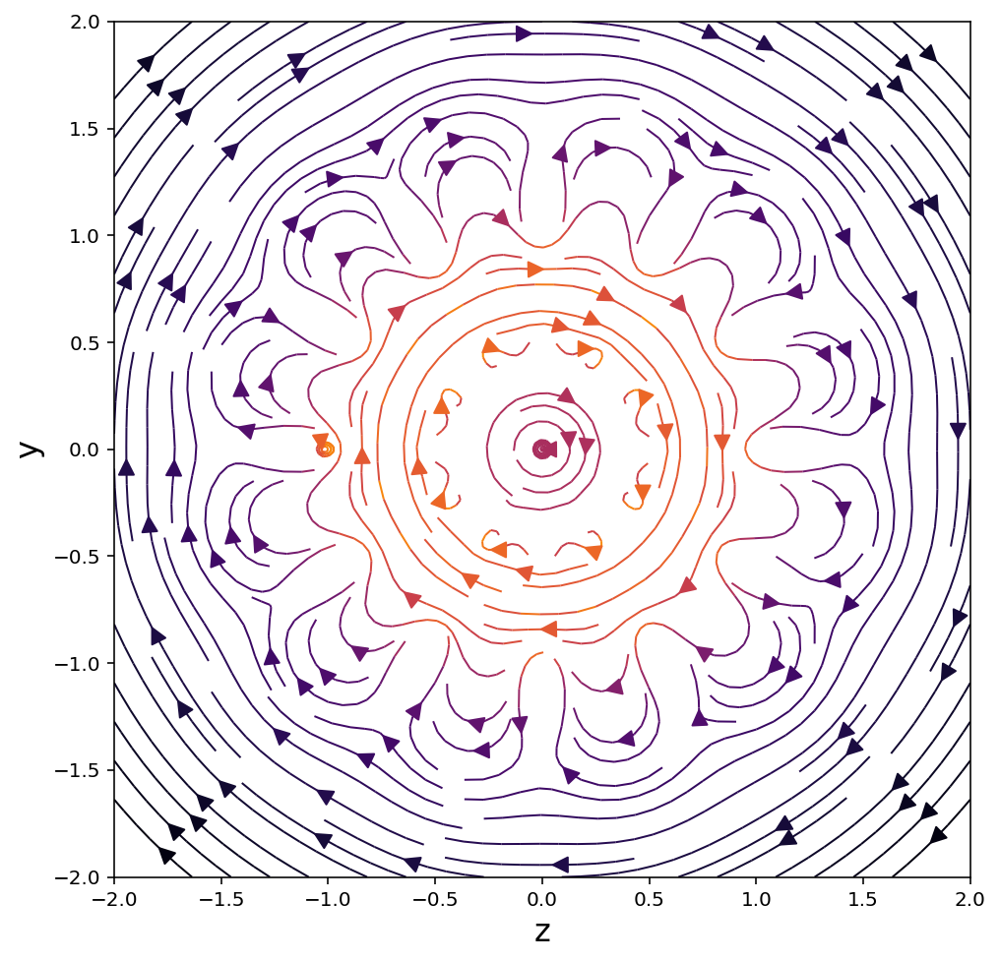

In [54]:
r=0.25
R_torus=0.75
div=12
tokamak_loops = [LoopWireCurrent(radius=r, I=1.2,  yOff=R_torus*np.sin(phi), zOff=-R_torus*np.cos(phi), theta=phi) for phi in np.arange(0, 2*np.pi, 2*np.pi/div)]
tokamak_loops=np.append(tokamak_loops, LoopWireCurrent(I=1, radius=R_torus, alpha=np.pi/2, color="green"))
graphLoops(tokamak_loops, xLim=2, yLim=2, zLim=2)
graphStreamPlots(tokamak_loops, xLim=2, yLim=2)

# later on, we want the middle loop to be black again
tokamak_loops = [LoopWireCurrent(radius=r, I=1.2,  yOff=R_torus*np.sin(phi), zOff=-R_torus*np.cos(phi), theta=phi) for phi in np.arange(0, 2*np.pi, 2*np.pi/div)]
tokamak_loops=np.append(tokamak_loops, LoopWireCurrent(I=1, radius=R_torus, alpha=np.pi/2, color="black"))

### Simulation of Particle Movement in Magnetic Bottle

In [12]:
def calc_force_on_charge_by_bfield(magnetic_field, charge_velocity, q = 1) :
    ''' Fill out description of appropriate arguments and/or keyword arguments.  magnetic field and velocity also
    need to be vectors, i.e. numpy arrays with three elements.  You will need to use np.cross
    from above. '''
    force = q*np.cross(charge_velocity, magnetic_field)
    return force


def calc_acceleration_of_charge_in_bfields(magnetic_field, charge_velocity, q, m) :
    ''' Calculate the acceleration of a charge in both electric and magnetic fields.  electric_field, magnetic_field,
    charge_velocity should all be vector-looking, i.e. numpy arrays with three elements'''
    
    acceleration = q*(np.cross(charge_velocity,magnetic_field))/m
    acceleration = (calc_force_on_charge_by_bfield(magnetic_field, charge_velocity, q))/m
    return acceleration


def get_updated_value(current_value, rate_of_change, dt) :
    updated_value = current_value+rate_of_change*dt
    return updated_value


def get_rates_of_change_euler(particle_position, particle_velocity, magnetic_field_function, q, m, dt) :
    '''When using Euler's method, the rates of change are simply the particle_velocity, and the acceleration
    due to the electric and magnetic field at that particle_position.  While this does not depend on dt, 
    we will keep it as an argument for parallels with the Runge-Kutta method'''
    
    magnetic_field_at_position = magnetic_field_function(particle_position)
    
    particle_acceleration = calc_acceleration_of_charge_in_bfields(magnetic_field_at_position, particle_velocity, q, m)
    return particle_velocity, particle_acceleration


def get_rates_of_change_runge_kutta(particle_position, particle_velocity, magnetic_field_function, q, m, dt) :
    ''' This uses the Runge-Kutta method to calculate the updated value.  This method relies on mid-points.
    Note, this method can replace get_rates_of_change_euler in the argument, get_rates_of_change_function, that
    is input to calc_trajectory_in_fields'''

    current_velocity, current_acceleration = get_rates_of_change_euler(particle_position, particle_velocity, magnetic_field_function, q, m, dt)
    
    mid_particle_velocity = current_velocity + current_acceleration * dt/2
    mid_particle_position = particle_position + mid_particle_velocity * dt/2
    
    # Calculate the acceleration due to the electric and magnetic fields at the mid_particle_position
    runge_kutta_velocity, runge_kutta_acceleration = get_rates_of_change_euler(mid_particle_position, mid_particle_velocity, magnetic_field_function, q, m, dt)
    return runge_kutta_velocity, runge_kutta_acceleration


def create_place_holder_array(timesteps) :
    ''' Returns a placeholder array '''
    return np.zeros((timesteps.size,3))


def calc_trajectory_in_fields(magnetic_field_function, get_rates_of_change_function, timesteps, particle_position, particle_velocity, q = 1, m=1) :
    '''This function takes in functions that output the electric (and magnetic) fields functions with an argument of particle
    position.  This also requires as an argument the timesteps you wish to iterate over, and the 
    initial conditions, of the particle_position and particle_velocity it starts out with.  The charge and mass are optional
    (key word arguments).'''
    
    # Create place holder arrays
    position_evolution = create_place_holder_array(timesteps)
    velocity_evolution = create_place_holder_array(timesteps)
    
    dt = timesteps[1]  # timesteps looks like np.array([0, dt, 2*dt, 3*dt, ...., (total_timesteps-1)*dt])
    for inum, timestep in enumerate(timesteps) :
        # Populate
        position_evolution[inum,:] = particle_position
        velocity_evolution[inum,:] = particle_velocity
        
        # Calculate velocity and acceleration due to e- and b-fields to update particle_position and particle_velocity
        position_rate_of_change, velocity_rate_of_change = \
            get_rates_of_change_function(particle_position, particle_velocity, magnetic_field_function, q, m, dt)
        
        # Update
        particle_position = get_updated_value(particle_position, position_rate_of_change, dt)
        particle_velocity = get_updated_value(particle_velocity, velocity_rate_of_change, dt)
        
    return position_evolution, velocity_evolution



In [38]:
def magnetic_bottle_bfield_at_point(grid_point):
    net_b_field=np.array([0.,0.,0.])
    for j in range(np.alen(magnetic_bottle_loops)):
        net_b_field += calc_bfield_at_point(grid_point, magnetic_bottle_loops[j])
    return net_b_field

def plotMagBottleTraj(x0, v0, t=100, dt=1e-2):
    timesteps=np.arange(0,t,dt)
    trajectory_evolution, velocity_evolution=calc_trajectory_in_fields(magnetic_bottle_bfield_at_point, get_rates_of_change_runge_kutta, timesteps, x0, v0)
    path = LoopWireCurrent(color="red")
    path.xwire=trajectory_evolution[:,0]
    path.ywire=trajectory_evolution[:,1]
    path.zwire=trajectory_evolution[:,2]
    graphLoops(np.append(magnetic_bottle_loops, (path)), xLim=3., yLim=3., zLim=3.)


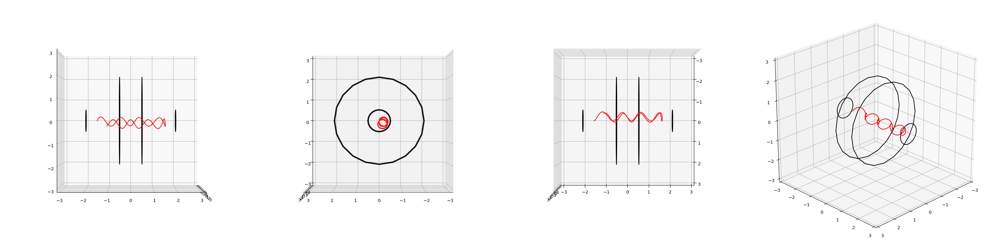

In [14]:
plotMagBottleTraj(np.array([0.,-1.5,0.]), np.array([0.,0.05,0.1]))

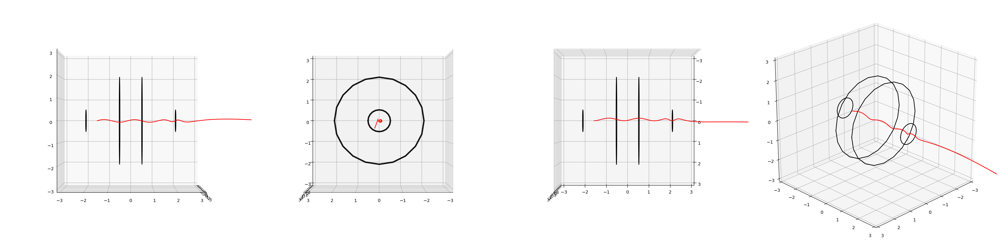

In [15]:
plotMagBottleTraj(np.array([0.,-1.5,0.]), np.array([0.,0.1,.03]))

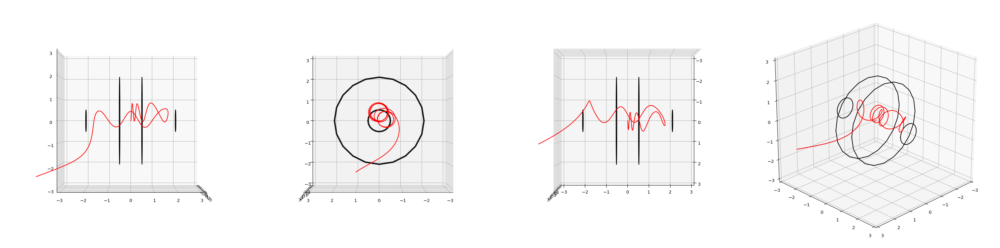

In [43]:
plotMagBottleTraj(np.array([0.,0,0.]), np.array([0.2,0.01,0.]))

### Simulation of Particle Movement in Tokamak Setup

In [55]:
def tokamak_bfield_at_point(grid_point):
    net_b_field=np.array([0.,0.,0.])
    for j in range(np.alen(tokamak_loops)):
        net_b_field += calc_bfield_at_point(grid_point, tokamak_loops[j])
    return net_b_field
def plotTokamakTraj(x0, v0, t=100, dt=1e-2):
    timesteps=np.arange(0,t,dt)
    trajectory_evolution, velocity_evolution=calc_trajectory_in_fields(tokamak_bfield_at_point, get_rates_of_change_runge_kutta, timesteps, x0, v0)
    path = LoopWireCurrent(color="red")
    path.xwire=trajectory_evolution[:,0]
    path.ywire=trajectory_evolution[:,1]
    path.zwire=trajectory_evolution[:,2]
    graphLoops(np.append(tokamak_loops, (path)), xLim=1.5, yLim=1.5, zLim=1.5)

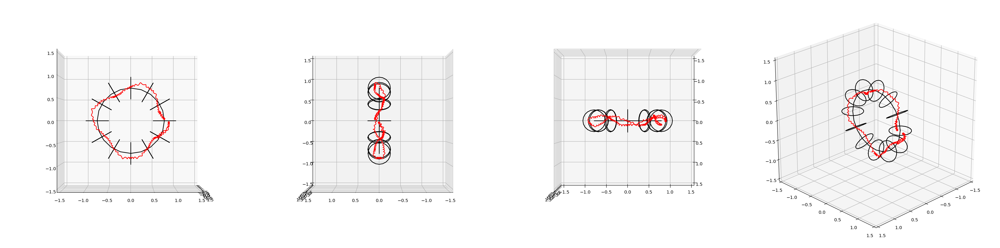

In [56]:
plotTokamakTraj(np.array([0.,R_torus-.1,0.2]),np.array([0.01,0.06,0.02]), t=200)

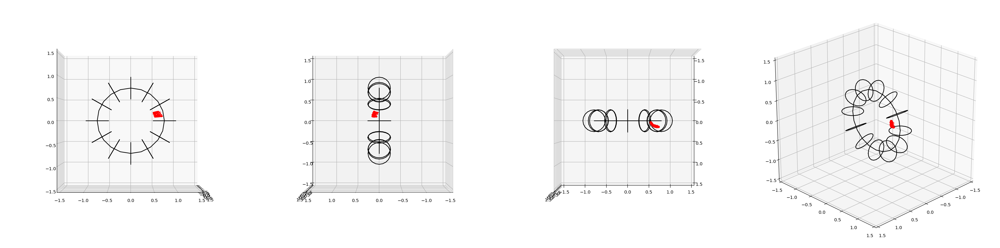

In [57]:
plotTokamakTraj(np.array([0.1,R_torus-.1,0.2]),np.array([0.04,0.03,0.03]))

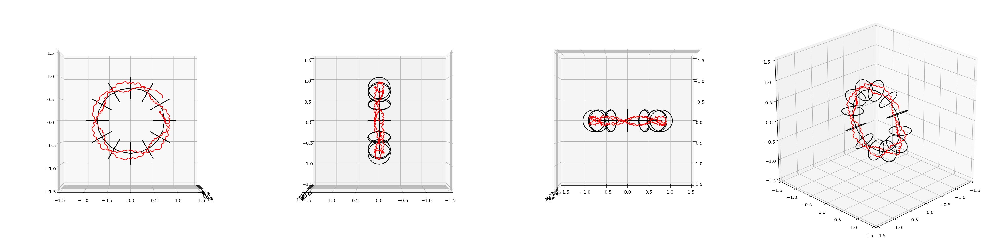

In [58]:
plotTokamakTraj(np.array([0,R_torus-.1,0.2]),np.array([0.01,0.075,0.01]), t=200)

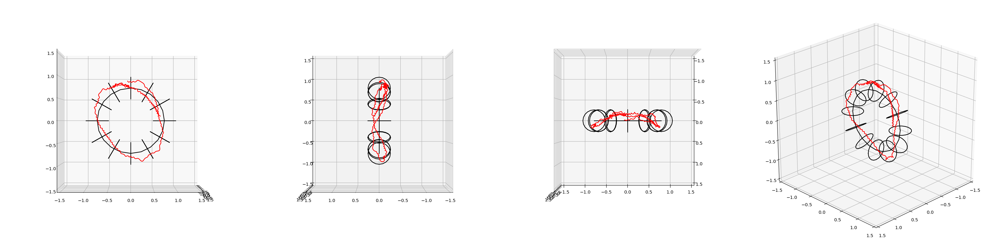

In [59]:
plotTokamakTraj(np.array([0.1,R_torus-.1,0.1]),np.array([0.01,0.02,0.05]), t=200)

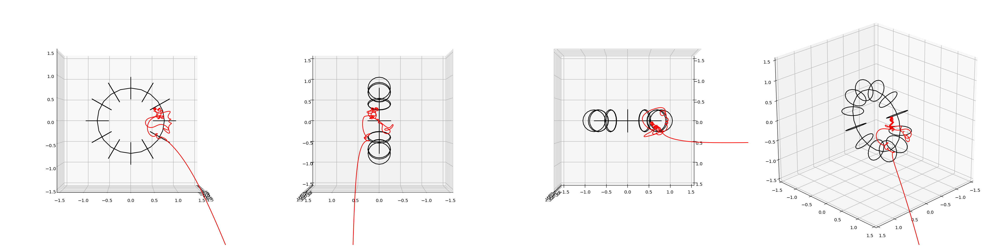

In [71]:
plotTokamakTraj(np.array([0.1,R_torus-.1,0.1]),np.array([0.08,0.07,0.08]))

### Discussion of Results